<a href="https://colab.research.google.com/github/breeramon/Comparacao-de-Imagens-Simples/blob/main/CompImagensGrupo6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

CÉDULA 1 - IMPORTS

In [ ]:
# --- Imports Necessários---
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from google.colab import files
from skimage.transform import rotate

# Para SSIM
from skimage.metrics import structural_similarity

# Para Tarefas 4 e 5 (Gerar .csv e ranking)
import pandas as pd

# --- Imports para a Interface Interativa (RF03) ---
import ipywidgets as widgets
from ipywidgets import HBox, VBox
from IPython.display import display, clear_output
from PIL import Image # Para exibir imagem no widget

CÉDULA 2

In [ ]:
def ler_imagem(caminho_arquivo):
    """Lê uma imagem usando cv.imread()"""
    return cv.imread(caminho_arquivo)

def exibir_imagem_colab(imagem, titulo="Imagem"):
    """Exibe a imagem no Google Colab usando cv2_imshow()"""
    print(titulo)
    cv2_imshow(imagem)

def converter_para_cinza(imagem):
    """Converte a imagem para escala de cinza usando cv.cvtColor()"""
    # Verifica se a imagem já não é cinza
    if len(imagem.shape) == 3 and imagem.shape[2] == 3:
        return cv.cvtColor(imagem, cv.COLOR_BGR2GRAY)
    return imagem

def rotacionar_imagem(imagem, angulo):
    """Rotaciona a imagem usando a função rotate() do skimage"""
    # Opcional: resize=True para evitar cortes
    return rotate(imagem, angulo, resize=True, mode='constant', cval=0, preserve_range=True).astype(imagem.dtype)

# def diferenciar_imagens_xor(img1, img2):
#     """
#     Gera um mapa de diferença visual usando cv.bitwise_xor().
#     Isso atende ao Requisito RF06.
#     """
#     # Garante que as imagens tenham o mesmo tamanho (requisito para bitwise_xor)
#     if img1.shape != img2.shape:
#         # Redimensiona img2 para o tamanho da img1
#         print("Aviso: Imagens com tamanhos diferentes. Redimensionando para comparação.")
#         img2 = cv.resize(img2, (img1.shape[1], img1.shape[0]))

#     return cv.bitwise_xor(img1, img2)

*TESTE CÉDULA 2*

In [ ]:
# --- Início do Teste da Célula 2 ---
print("Testando ler_imagem...")
img_teste = ler_imagem('flores.png') # Use o nome da imagem que você subiu

# Teste de falha:
if img_teste is None:
    print("FALHA: Não foi possível ler a imagem. Verifique o nome do arquivo.")
else:
    print("SUCESSO: Imagem lida. Dimensões:", img_teste.shape)

    print("\nTestando exibir_imagem_colab...")
    exibir_imagem_colab(img_teste, "Teste de Exibição")
    # Resultado esperado: A imagem deve aparecer no output.

    print("\nTestando converter_para_cinza...")
    img_cinza = converter_para_cinza(img_teste)
    exibir_imagem_colab(img_cinza, "Teste de Cinza")
    # Resultado esperado: A imagem deve aparecer em escala de cinza.

    print("\nTestando rotacionar_imagem...")
    img_rotacionada = rotacionar_imagem(img_teste, 30) # Rotaciona 30 graus
    exibir_imagem_colab(img_rotacionada, "Teste de Rotação")
    # Resultado esperado: A imagem deve aparecer rotacionada.

    print("\nTestando diferenciar_imagens_xor (comparando com ela mesma)...")
    mapa_dif_zero = diferenciar_imagens_xor(img_teste, img_teste)
    exibir_imagem_colab(mapa_dif_zero, "Teste XOR (Zero)")
    # Resultado esperado: A imagem deve ser COMPLETAMENTE PRETA (pois é idêntica).

    print("\nTestando diferenciar_imagens_xor (comparando com rotacionada)...")
    mapa_dif_rot = diferenciar_imagens_xor(img_teste, img_rotacionada)
    exibir_imagem_colab(mapa_dif_rot, "Teste XOR (Diferente)")
    # Resultado esperado: Uma imagem com contornos/áreas claras onde há diferença.
# --- Fim do Teste da Célula 2 ---

Testando ler_imagem...
FALHA: Não foi possível ler a imagem. Verifique o nome do arquivo.


CÉDULA 3

In [ ]:
def calcular_diferenca_media(img1, img2):
    """
    Calcula a "diferença média" (Tarefa 2).
    Implementa a "Diferença Absoluta" de forma métrica.
    """
    # Garante que as imagens tenham o mesmo tamanho
    if img1.shape != img2.shape:
        img2 = cv.resize(img2, (img1.shape[1], img1.shape[0]))

    # Calcula a diferença absoluta e depois a média
    diferenca = cv.absdiff(img1.astype("float"), img2.astype("float"))
    media_diferenca = np.mean(diferenca)
    return media_diferenca

def calcular_ssim(img1, img2):
    """Calcula o SSIM (Structural Similarity Index)"""

    # Converte para escala de cinza, pois o SSIM é geralmente calculado em monocromático
    img1_cinza = converter_para_cinza(img1)
    img2_cinza = converter_para_cinza(img2)

    # Garante que as imagens tenham o mesmo tamanho
    if img1_cinza.shape != img2_cinza.shape:
        img2_cinza = cv.resize(img2_cinza, (img1_cinza.shape[1], img1_cinza.shape[0]))

    # O 'data_range' é o intervalo dinâmico da imagem (255 para 8-bit)
    (score, diff_map) = structural_similarity(img1_cinza, img2_cinza, full=True, data_range=255)

    # O diff_map também pode ser usado como mapa visual
    return score

def calcular_indice_ruido_residual(img_processada):
    """(Pendente) Calcula o índice de ruído residual (Tarefa 3)"""
    # Esta métrica NÃO está definida no PDF da Unidade I.
    # Precisaremos da fórmula/definição dela.
    print("Implementação do 'índice de ruído residual' pendente.")
    return 0.0

def diferenciar_imagens_xor(img1, img2):
    """
    Gera um mapa de diferença visual usando cv.bitwise_xor().
    Atende à Tarefa 6 do Grupo 6 e ao RF06.
    """
    if img1.shape != img2.shape:
        print("Aviso: Imagens com tamanhos diferentes. Redimensionando para comparação.")
        img2 = cv.resize(img2, (img1.shape[1], img1.shape[0]))

    # Garante que ambas as imagens sejam BGR (3 canais) para o XOR funcionar
    # ou ambas sejam cinza (1 canal).
    if (len(img1.shape) == 2 and len(img2.shape) == 3):
        img1 = cv.cvtColor(img1, cv.COLOR_GRAY2BGR)
    if (len(img2.shape) == 2 and len(img1.shape) == 3):
        img2 = cv.cvtColor(img2, cv.COLOR_GRAY2BGR)

    return cv.bitwise_xor(img1, img2)

*TESTE CÉDULA 3*

In [ ]:
# --- Início do Teste da Célula 3 ---
print("\nTestando calcular_diferenca_media (consigo mesma)...")
media_zero = calcular_diferenca_media(img_teste, img_teste)
print(f"Resultado: {media_zero}")
# Resultado esperado: Deve imprimir 0.0

print("\nTestando calcular_diferenca_media (com rotacionada)...")
media_dif = calcular_diferenca_media(img_teste, img_rotacionada)
print(f"Resultado: {media_dif}")
# Resultado esperado: Deve imprimir um número positivo (ex: 45.123...)

print("\nTestando calcular_ssim (consigo mesma)...")
ssim_um = calcular_ssim(img_teste, img_teste)
print(f"Resultado: {ssim_um}")
# Resultado esperado: Deve imprimir 1.0

print("\nTestando calcular_ssim (com rotacionada)...")
ssim_dif = calcular_ssim(img_teste, img_rotacionada)
print(f"Resultado: {ssim_dif}")
# Resultado esperado: Deve imprimir um número menor que 1 (ex: 0.345...)
# --- Fim do Teste da Célula 3 ---


Testando calcular_diferenca_media (consigo mesma)...


AttributeError: 'NoneType' object has no attribute 'shape'

CÉDULA 4

Imagens carregadas (exemplo).

--- Iniciando Processamento ---
Erro ao carregar Processamento 1. Pulando.

--- Processando: Processamento 2 ---
Implementação do 'índice de ruído residual' pendente.
Resultados Métricos para Processamento 2:
  Diferença Média: 66.8724
  SSIM (Similaridade): 0.6636
Mapa de Diferença (XOR) - Processamento 2


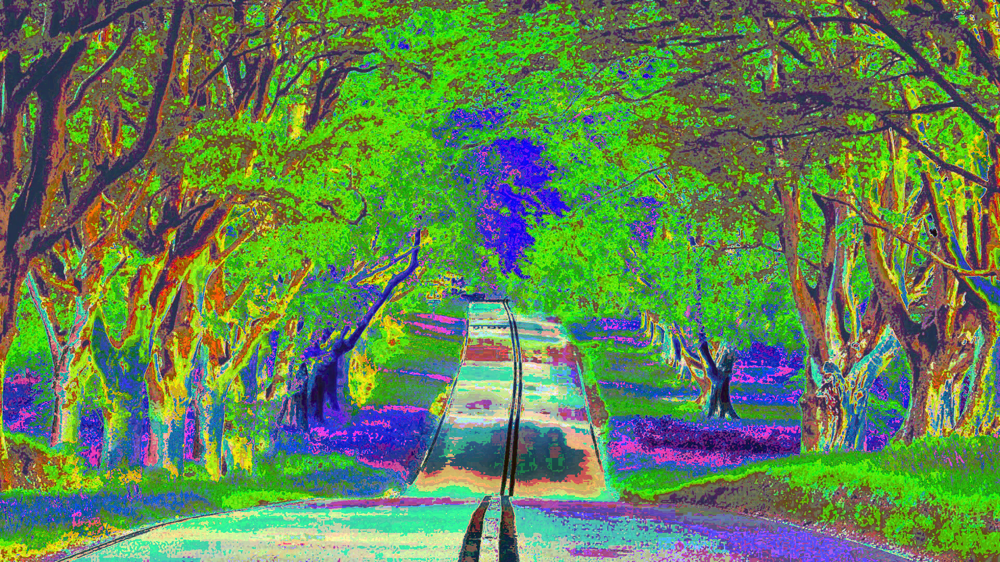


--- Processamento Concluído ---


In [ ]:
# --- 1. Carregar Imagens ---
# (Substitua pelos nomes das suas imagens)
try:
    # Tenta carregar imagens de exemplo
    img_original = ler_imagem('avenida.jpg')
    img_processada_1 = ler_imagem('avenidaEDIT.jpg')
    img_processada_2 = ler_imagem('avenidaEDIT2.jpg')

    if img_original is None:
        raise FileNotFoundError("Imagem original não encontrada.")

    print("Imagens carregadas (exemplo).")

    # Lista de imagens para processar
    imagens_para_comparar = [
        {"nome": "Processamento 1", "img": img_processada_1},
        {"nome": "Processamento 2", "img": img_processada_2}
    ]

except FileNotFoundError:
    print("Arquivos de exemplo não encontrados.")
    print("Por favor, faça o upload das suas imagens (original e processadas).")
    # files.upload() # Descomente para fazer upload

# Lista para guardar os resultados (para Tarefa 4)
lista_de_resultados = []

print("\n--- Iniciando Processamento ---")

# --- 2. Alinhar Imagens ---
# (Esta etapa é complexa, vamos assumir que estão alinhadas por enquanto)
# (Se não estiverem, teríamos que usar técnicas como feature matching)

for item in imagens_para_comparar:
    nome = item["nome"]
    img_proc = item["img"]

    if img_proc is None:
        print(f"Erro ao carregar {nome}. Pulando.")
        continue

    print(f"\n--- Processando: {nome} ---")

    # --- 3. Aplicar Métricas de Comparação ---

    # Métrica 1: Diferença Média (Tarefa 2)
    diff_media = calcular_diferenca_media(img_original, img_proc)

    # Métrica 2: SSIM (Tarefa 2)
    ssim_score = calcular_ssim(img_original, img_proc)

    # Métrica 3: Ruído Residual (Tarefa 3)
    ruido_residual = calcular_indice_ruido_residual(img_proc) # Pendente

    # --- 4. Gerar Mapa de Diferenças ---
    mapa_diferenca = diferenciar_imagens_xor(img_original, img_proc)

    # --- 5. Exibir Resultado Visual e Métrico [cite: 93] ---
    print(f"Resultados Métricos para {nome}:")
    print(f"  Diferença Média: {diff_media:.4f}")
    print(f"  SSIM (Similaridade): {ssim_score:.4f}")

    exibir_imagem_colab(mapa_diferenca, f"Mapa de Diferença (XOR) - {nome}")

    # Adiciona à lista para o CSV (Tarefa 4)
    lista_de_resultados.append({
        "Imagem_Processada": nome,
        "Diferenca_Media": diff_media,
        "SSIM": ssim_score,
        "Ruido_Residual_Pendente": ruido_residual
    })

print("\n--- Processamento Concluído ---")

In [ ]:
# --- 1. Definição das Funções de Edição (RF03) ---
# (As mesmas funções que definimos antes)

def ajustar_brilho_contraste(imagem, brilho=0, contraste=1.0):
    """Ajusta o brilho (beta) e o contraste (alpha)."""
    if imagem is None:
        return None
    return cv.convertScaleAbs(imagem, alpha=contraste, beta=brilho)

def ajustar_saturacao(imagem, valor=1.0):
    """Ajusta a saturação de uma imagem (multiplicador)."""
    if imagem is None:
        return None
    try:
        img_hsv = cv.cvtColor(imagem, cv.COLOR_BGR2HSV)
        img_hsv = np.float32(img_hsv)
        h, s, v = cv.split(img_hsv)
        s = s * valor
        s = np.clip(s, 0, 255)
        img_hsv_merged = cv.merge([h, s, v])
        img_hsv_merged = np.uint8(img_hsv_merged)
        img_saturada = cv.cvtColor(img_hsv_merged, cv.COLOR_HSV2BGR)
        return img_saturada
    except cv.error:
        # Erro comum se a imagem for em escala de cinza
        return imagem

def redimensionar_imagem(imagem, escala_percent=100):
    """Redimensiona a imagem com base em uma porcentagem."""
    if imagem is None or escala_percent == 100:
        return imagem
    fator = escala_percent / 100.0
    nova_largura = int(imagem.shape[1] * fator)
    nova_altura = int(imagem.shape[0] * fator)
    dimensoes = (nova_largura, nova_altura)
    return cv.resize(imagem, dimensoes, interpolation=cv.INTER_AREA)

def rotacionar_imagem_skimage(imagem, angulo):
    """Rotaciona a imagem usando a função rotate() do skimage"""
    if imagem is None or angulo == 0:
        return imagem
    return rotate(imagem, angulo, resize=True, mode='constant', cval=0, preserve_range=True).astype(imagem.dtype)

# --- 2. Criação da Interface Interativa ---

# Variáveis globais para armazenar as imagens
img_para_editar = None
img_editada_atual = None
nome_arquivo_edicao = ""

# --- Widgets de Controle ---
uploader_edicao = widgets.FileUpload(
    accept='.jpg,.jpeg,.png',
    multiple=False,
    description='1. Enviar Imagem'
)

# Sliders de Edição
slider_brilho = widgets.IntSlider(value=0, min=-100, max=100, description='Brilho:')
slider_contraste = widgets.FloatSlider(value=1.0, min=0.0, max=3.0, step=0.1, description='Contraste:')
slider_saturacao = widgets.FloatSlider(value=1.0, min=0.0, max=3.0, step=0.1, description='Saturação:')
slider_rotacao = widgets.IntSlider(value=0, min=-180, max=180, description='Rotação (°):')
slider_redim = widgets.IntSlider(value=100, min=10, max=200, step=5, description='Redim. (%):')

# Botões de Ação
botao_aplicar = widgets.Button(description="2. Aplicar Edições", button_style='primary')
botao_resetar = widgets.Button(description="Resetar", button_style='warning')

# Campo para salvar
campo_nome_arquivo = widgets.Text(value='editada.png', description='3. Nome:')
botao_salvar = widgets.Button(description="Salvar Imagem", button_style='success')

# Área de Saída (para logs e imagem)
output_edicao = widgets.Output(layout={'border': '1px solid black', 'padding': '10px'})

# --- 3. Lógica (Funções dos Botões) ---

def ao_carregar_imagem(change):
    """Chamado quando uma imagem é enviada pelo uploader."""
    global img_para_editar, img_editada_atual, nome_arquivo_edicao

    with output_edicao:
        clear_output()
        if not uploader_edicao.value:
            print("Upload cancelado.")
            return

        nome_arquivo = list(uploader_edicao.value.keys())[0]
        conteudo = list(uploader_edicao.value.values())[0]['content']

        # Salva temporariamente para o OpenCV ler
        with open(nome_arquivo, 'wb') as f:
            f.write(conteudo)

        img_para_editar = cv.imread(nome_arquivo)

        if img_para_editar is None:
            print(f"Erro: Nao foi possivel ler o arquivo '{nome_arquivo}'.")
            img_para_editar = None
        else:
            img_editada_atual = img_para_editar.copy()
            nome_arquivo_edicao = nome_arquivo
            print(f"Sucesso: Imagem '{nome_arquivo}' carregada. Pronto para editar.")
            exibir_imagem_pil(img_editada_atual, "Pré-visualização:")

        # Limpa o uploader
        uploader_edicao.value.clear()
        uploader_edicao._counter = 0


def ao_aplicar_edicoes(b):
    """Aplica todos os sliders na imagem original."""
    global img_para_editar, img_editada_atual
    with output_edicao:
        clear_output()
        if img_para_editar is None:
            print("Erro: Nenhuma imagem carregada. Use o '1. Enviar Imagem' primeiro.")
            return

        print("Aplicando edições...")
        # Começa sempre da imagem original para evitar edições cumulativas
        temp_img = img_para_editar.copy()

        # Aplica edições em sequência
        temp_img = ajustar_brilho_contraste(temp_img, slider_brilho.value, slider_contraste.value)
        temp_img = ajustar_saturacao(temp_img, slider_saturacao.value)
        temp_img = rotacionar_imagem_skimage(temp_img, slider_rotacao.value)
        temp_img = redimensionar_imagem(temp_img, slider_redim.value)

        img_editada_atual = temp_img
        print("Edições aplicadas! Veja a pré-visualização.")
        exibir_imagem_pil(img_editada_atual, "Pré-visualização da Edição:")

def ao_resetar_edicoes(b):
    """Reseta os sliders e a imagem."""
    global img_editada_atual, img_para_editar
    with output_edicao:
        clear_output()
        slider_brilho.value = 0
        slider_contraste.value = 1.0
        slider_saturacao.value = 1.0
        slider_rotacao.value = 0
        slider_redim.value = 100

        if img_para_editar is not None:
            img_editada_atual = img_para_editar.copy()
            print("Sliders e imagem resetados para o original.")
            exibir_imagem_pil(img_editada_atual, "Pré-visualização Original:")
        else:
            print("Sliders resetados.")

def ao_salvar_imagem(b):
    """Salva a imagem editada no ambiente do Colab."""
    global img_editada_atual
    with output_edicao:
        if img_editada_atual is None:
            print("Erro: Nao ha nenhuma imagem editada para salvar.")
            return

        nome_salvo = campo_nome_arquivo.value
        if not nome_salvo.lower().endswith(('.png', '.jpg', '.jpeg')):
            print("Erro: O nome do arquivo deve terminar com .png, .jpg ou .jpeg.")
            return

        try:
            cv.imwrite(nome_salvo, img_editada_atual)
            print(f"\nSucesso! Imagem salva como '{nome_salvo}' no ambiente do Colab.")
            print("Agora voce pode usa-la na proxima celula (Fluxo de Comparacao).")
        except Exception as e:
            print(f"Erro ao salvar a imagem: {e}")

def exibir_imagem_pil(img_cv, titulo=""):
    """Função auxiliar para exibir imagem cv2 no widget de output."""
    if img_cv is None:
        return
    print(titulo)
    img_rgb = cv.cvtColor(img_cv, cv.COLOR_BGR2RGB)
    img_pil = Image.fromarray(img_rgb)
    display(img_pil)

# --- 4. Montagem da Interface ---

# Liga os botões às suas funções
uploader_edicao.observe(ao_carregar_imagem, names='_counter')
botao_aplicar.on_click(ao_aplicar_edicoes)
botao_resetar.on_click(ao_resetar_edicoes)
botao_salvar.on_click(ao_salvar_imagem)

# Organiza o layout
controles_edicao = VBox([
    slider_brilho,
    slider_contraste,
    slider_saturacao,
    slider_rotacao,
    slider_redim,
    HBox([botao_aplicar, botao_resetar])
])
controles_salvar = HBox([campo_nome_arquivo, botao_salvar])

# Exibe a interface completa
print("--- Oficina de Edição Interativa (RF03) ---")
print("1. Envie uma imagem para editar.")
print("2. Ajuste os sliders e clique em 'Aplicar Edições' para ver o resultado.")
print("3. Clique em 'Salvar Imagem' para guarda-la no Colab.")
print("4. A imagem salva podera ser usada na proxima celula.")

display(uploader_edicao, controles_edicao, controles_salvar, output_edicao)

--- Oficina de Edição Interativa (RF03) ---
1. Envie uma imagem para editar.
2. Ajuste os sliders e clique em 'Aplicar Edições' para ver o resultado.
3. Clique em 'Salvar Imagem' para guarda-la no Colab.
4. A imagem salva podera ser usada na proxima celula.


FileUpload(value={}, accept='.jpg,.jpeg,.png', description='1. Enviar Imagem')

Output(layout=Layout(border='1px solid black', padding='10px'))

CÉDULA 4 - INPUT PRO USUÁRIO

--- Etapa 1: Upload da Imagem Original ---
Por favor, selecione a imagem 'Original'. Formatos: ('.jpg', '.jpeg', '.png'), Tamanho Max: 5MB


Saving avenida.jpg to avenida.jpg

Sucesso! Imagem Original 'avenida.jpg' carregada.

--- Etapa 2: Upload das Imagens Processadas ---
Agora, selecione UMA OU MAIS imagens 'Processadas' para comparar.


Saving avenidaEDIT2.jpg to avenidaEDIT2.jpg

Sucesso! 1 arquivo(s) selecionado(s).

--- Iniciando Processamento ---

--- Processando Comparacao: avenidaEDIT2.jpg ---
Implementação do 'índice de ruído residual' pendente.
Resultados Métricos para avenidaEDIT2.jpg:
  Diferença Média: 66.8724
  SSIM (Similaridade): 0.6636


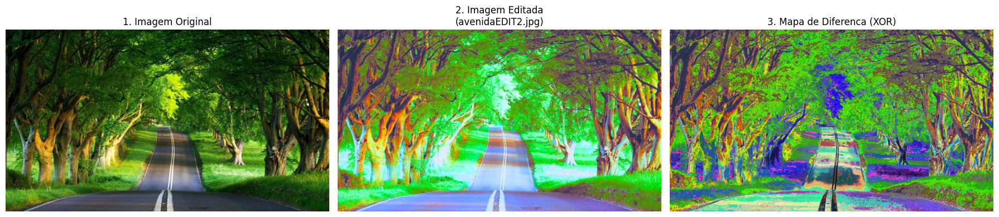


--- Processamento Concluído ---


In [ ]:
# --- Imports de ferramentas de upload ---
from google.colab import files
import os

EXTENSOES_PERMITIDAS = ('.jpg', '.jpeg', '.png')
# Define o tamanho maximo (5MB)
TAMANHO_MAX_BYTES = 5 * 1024 * 1024

# Lista para guardar os resultados
lista_de_resultados = []

# --- 1. Carregar Imagem Original (RF01) ---
print("--- Etapa 1: Upload da Imagem Original ---")
print(f"Por favor, selecione a imagem 'Original'. Formatos: {EXTENSOES_PERMITIDAS}, Tamanho Max: 5MB")

# Limpa uploads antigos
try:
    for f in os.listdir('.'):
        if f.lower().endswith(('.png', '.jpg', '.jpeg', '.csv')):
            os.remove(f)
except:
    pass

uploaded_original = files.upload()

if not uploaded_original:
    print("\nErro: Nenhuma imagem original foi selecionada. Abortando.")
else:
    nome_arquivo_original = list(uploaded_original.keys())[0]
    bytes_arquivo_original = uploaded_original[nome_arquivo_original]

    # --- INICIO DAS VALIDACOES ---
    # 1. Validação de Formato
    if not nome_arquivo_original.lower().endswith(EXTENSOES_PERMITIDAS):
        print(f"\nErro: Formato de arquivo invalido! ('{nome_arquivo_original}')")
        print(f"O sistema so aceita os formatos {EXTENSOES_PERMITIDAS}. [RF04]")
    # 2. Validação de Tamanho
    elif len(bytes_arquivo_original) > TAMANHO_MAX_BYTES:
        print(f"\nErro: Arquivo muito grande! ('{nome_arquivo_original}')")
        print(f"O tamanho maximo permitido e de 5MB.")
    # --- FIM DAS VALIDACOES ---

    else:
        # A imagem e valida, continua o processo
        img_original = ler_imagem(nome_arquivo_original)

        if img_original is None:
            print(f"Erro ao ler o arquivo {nome_arquivo_original}.")
        else:
            print(f"\nSucesso! Imagem Original '{nome_arquivo_original}' carregada.")
            # Nao exibe aqui, pois sera exibida na comparacao

            # --- 2. Carregar Imagens Processadas (RF01) ---
            print("\n--- Etapa 2: Upload das Imagens Processadas ---")
            print(f"Agora, selecione UMA OU MAIS imagens 'Processadas' para comparar.")

            uploaded_processadas = files.upload()

            if not uploaded_processadas:
                print("\nErro: Nenhuma imagem processada foi selecionada.")
            else:
                print(f"\nSucesso! {len(uploaded_processadas)} arquivo(s) selecionado(s).")
                print("\n--- Iniciando Processamento ---")

                for nome_arquivo_processado, bytes_arquivo_processado in uploaded_processadas.items():

                    # --- VALIDACOES ---
                    if not nome_arquivo_processado.lower().endswith(EXTENSOES_PERMITIDAS):
                        print(f"\nIgnorando '{nome_arquivo_processado}': Formato nao permitido. [RF04]")
                        continue
                    elif len(bytes_arquivo_processado) > TAMANHO_MAX_BYTES:
                        print(f"\nIgnorando '{nome_arquivo_processado}': Arquivo maior que 5MB.")
                        continue
                    # --- FIM DAS VALIDACOES ---

                    img_proc = ler_imagem(nome_arquivo_processado)

                    if img_proc is None:
                        print(f"\nErro ao ler {nome_arquivo_processado}. Pulando.")
                        continue

                    print(f"\n--- Processando Comparacao: {nome_arquivo_processado} ---")

                    # --- 3. Aplicar Métricas de Comparação ---
                    diff_media = calcular_diferenca_media(img_original, img_proc)
                    ssim_score = calcular_ssim(img_original, img_proc)
                    ruido_residual = calcular_indice_ruido_residual(img_proc)

                    # --- 4. Gerar Mapa de Diferenças ---
                    mapa_diferenca = diferenciar_imagens_xor(img_original, img_proc)

                    # --- 5. Exibir Resultado Visual Lado a Lado ---
                    print(f"Resultados Métricos para {nome_arquivo_processado}:")
                    print(f"  Diferença Média: {diff_media:.4f}")
                    print(f"  SSIM (Similaridade): {ssim_score:.4f}")

                    # Configura o plot (1 linha, 3 colunas)
                    plt.figure(figsize=(18, 6)) # Tamanho maior para 3 imagens

                    # Imagem 1: Original
                    plt.subplot(1, 3, 1)
                    plt.title("1. Imagem Original")
                    plt.imshow(cv.cvtColor(img_original, cv.COLOR_BGR2RGB))
                    plt.axis('off')

                    # Imagem 2: Processada
                    plt.subplot(1, 3, 2)
                    plt.title(f"2. Imagem Editada\n({nome_arquivo_processado})")
                    plt.imshow(cv.cvtColor(img_proc, cv.COLOR_BGR2RGB))
                    plt.axis('off')

                    # Imagem 3: Mapa de Diferença
                    plt.subplot(1, 3, 3)
                    plt.title("3. Mapa de Diferenca (XOR)")
                    # O mapa de diferença pode ser cinza ou colorido
                    if len(mapa_diferenca.shape) == 2:
                        plt.imshow(mapa_diferenca, cmap='gray')
                    else:
                        plt.imshow(cv.cvtColor(mapa_diferenca, cv.COLOR_BGR2RGB))
                    plt.axis('off')

                    plt.tight_layout() # Ajusta o espaçamento
                    plt.show() # Exibe a figura com as 3 imagens

                    lista_de_resultados.append({
                        "Imagem_Processada": nome_arquivo_processado,
                        "Diferenca_Media": diff_media,
                        "SSIM": ssim_score,
                        "Ruido_Residual_Pendente": ruido_residual
                    })

                print("\n--- Processamento Concluído ---")

In [ ]:
if lista_de_resultados:
    # --- 4. Registrar todos os resultados em .csv ---
    df_resultados = pd.DataFrame(lista_de_resultados)

    # --- 5. Criar um ranking automático ---
    # Vamos rankear pelo SSIM (quanto maior, melhor)
    df_ranking = df_resultados.sort_values(by="SSIM", ascending=False)
    df_ranking['Ranking_Qualidade'] = range(1, len(df_ranking) + 1)

    print("\n--- Ranking Final de Qualidade (Baseado no SSIM) ---")
    print(df_ranking.to_string()) # .to_string() formata melhor no Colab

    # Salvar em CSV
    nome_arquivo_csv = 'ranking_comparacao_grupo6.csv'
    df_ranking.to_csv(nome_arquivo_csv, index=False)

    print(f"\nResultados salvos em '{nome_arquivo_csv}'.")
    # files.download(nome_arquivo_csv) # Descomente para baixar o CSV

else:
    print("Nenhum resultado foi processado para gerar o ranking.")


--- Ranking Final de Qualidade (Baseado no SSIM) ---
  Imagem_Processada  Diferenca_Media      SSIM  Ruido_Residual_Pendente  Ranking_Qualidade
0  avenidaEDIT2.jpg        66.872446  0.663595                      0.0                  1

Resultados salvos em 'ranking_comparacao_grupo6.csv'.
